In [1]:
from pathlib import Path
root_path = Path("..")

In [2]:
assert(root_path.exists())

In [6]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
from srresnet.train import *
from srresnet.checkpoint import *
from srresnet.eval import *

In [8]:
from torchvision.transforms import ToTensor, ToPILImage
from torch.nn import functional as F

In [6]:
load_checkpoint?

In [9]:
device = torch.device("cpu")
print(device)    

cpu


In [10]:
model = load_checkpoint("../checkpoints/resnet_best_loss_checkpoint.pth", device)

In [11]:
valid_dataset = SRImageDataset("test_HR_image/", is_valid=True)

In [13]:
lr, hr, lr_real = valid_dataset[0] #20
model.eval()
sr = model(lr.unsqueeze(0).to(device)).to("cpu").squeeze(0)

In [20]:
print(sr.shape, hr.shape, lr.unsqueeze(0).shape)

torch.Size([3, 2160, 3840]) torch.Size([3, 2160, 3840]) torch.Size([1, 3, 540, 960])


In [30]:
import torch
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def convert_image(img, source, target):
    device = torch.device("cpu")
    rgb_weights = torch.FloatTensor([65.481, 128.553, 24.966]).to(device)
    if source == '[-1, 1]':
        img = (img + 1.0) / 2.0

    if target == 'y-channel':
        img = torch.matmul(255. * img.permute(0, 2, 3, 1)[:, 4:-4, 4:-4, :], rgb_weights) / 255. + 16.0

    return img

In [31]:
sr_y = convert_image(sr.unsqueeze(0), source='[-1, 1]', target='y-channel').squeeze(0)
hr_y = convert_image(hr.unsqueeze(0), source='[-1, 1]', target='y-channel').squeeze(0)

hr_y = hr_y.detach().cpu().numpy()
sr_y = sr_y.detach().cpu().numpy()

psnr = peak_signal_noise_ratio(hr_y, sr_y, data_range=255.)
ssim = structural_similarity(hr_y, sr_y,data_range=255.)

print('PSNR - {0:.3f}'.format(psnr))
print('SSIM - {0:.3f}'.format(ssim))

PSNR - 7.601
SSIM - 0.270


In [21]:
sr.shape, hr.shape, lr_real.shape

(torch.Size([3, 2160, 3840]),
 torch.Size([3, 2160, 3840]),
 torch.Size([3, 25, 44]))

In [13]:
ToPILImage()(lr_real)

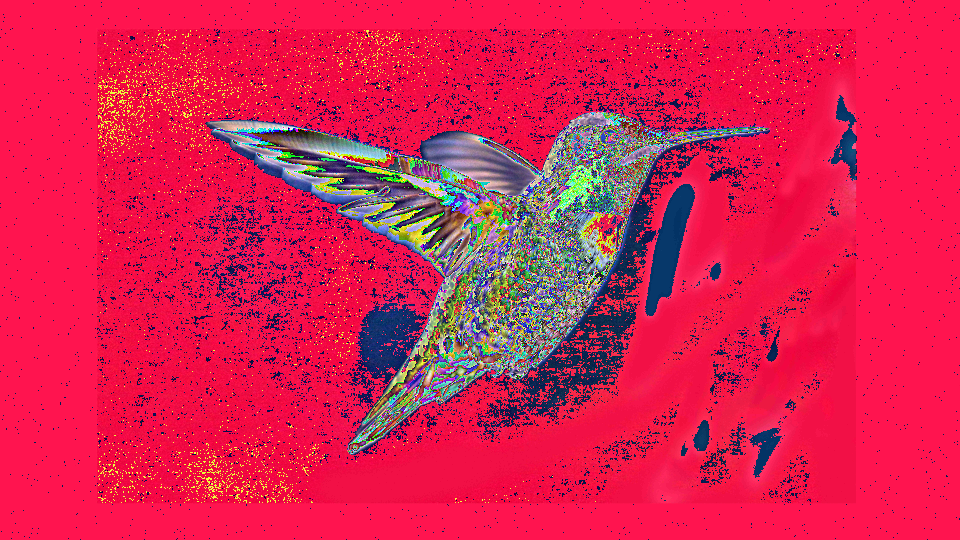

In [14]:
ToPILImage()(example)

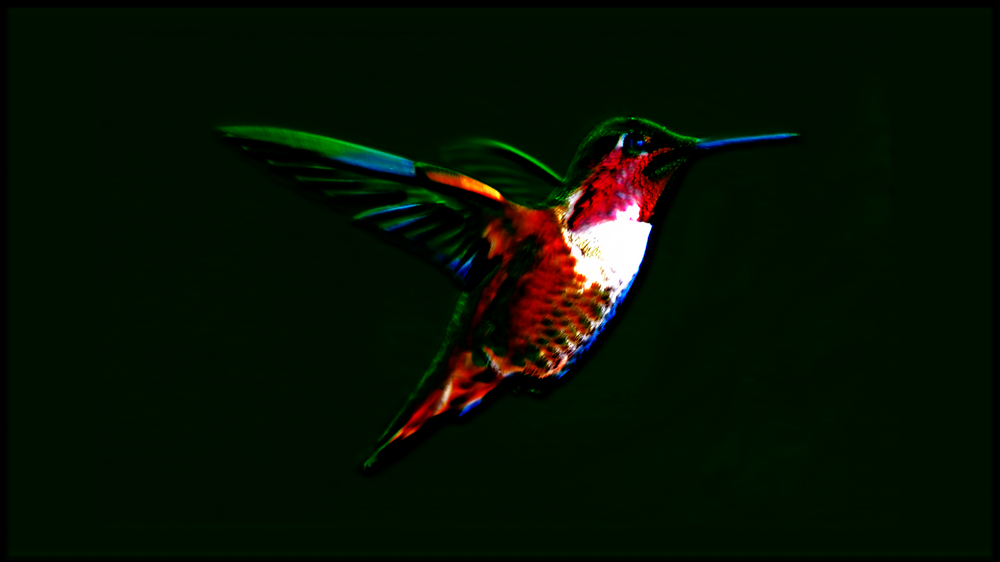

In [20]:
output_to_pil_image(out)

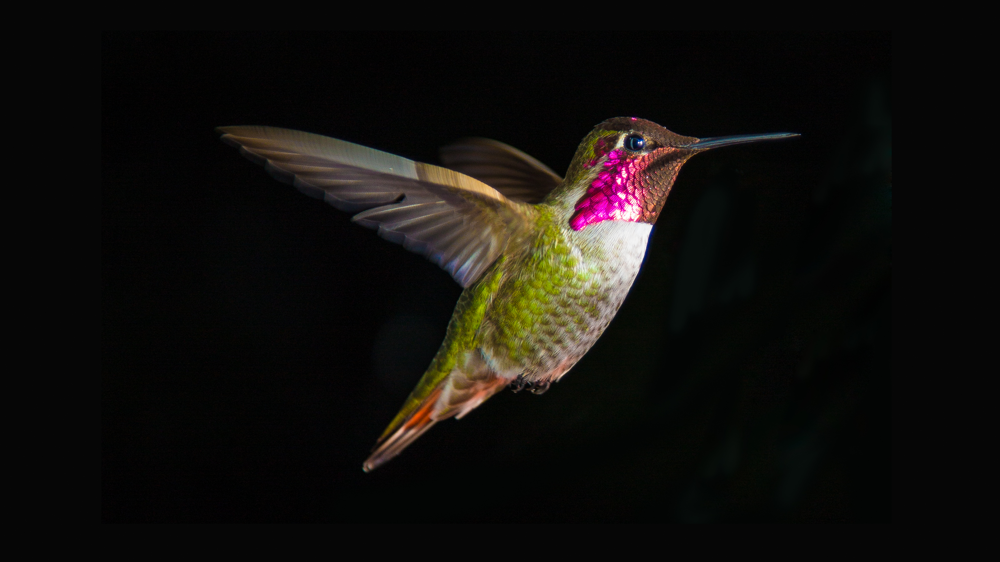

In [15]:
ToPILImage()(hr)